In [ ]:
import os

# Paths for the directories
content_dir = 'Dataset/Q3/content'
styles_dir = 'Dataset/Q3/styles'

# List to store paths
content_paths = []
styles_paths = []

# Loop through the content directory and store the file paths
for filename in os.listdir(content_dir):
    if filename.endswith('.jpg'):  # Check if the file is a .jpg file
        content_paths.append(f"{content_dir}/{filename}")

# Loop through the styles directory and store the file paths
for filename in os.listdir(styles_dir):
    if filename.endswith('.jpg'):  # Check if the file is a .jpg file
        styles_paths.append(f"{styles_dir}/{filename}")

# Print the paths (or save to a file, etc.)
print("Content Image Paths:")
for path in content_paths:
    print(path)

print("\nStyles Image Paths:")
for path in styles_paths:
    print(path)
    

Content Image Paths:
Dataset/Q3/content/bear.jpg
Dataset/Q3/content/building.jpg
Dataset/Q3/content/cat-on-table.jpg
Dataset/Q3/content/cat-sleeping.jpg
Dataset/Q3/content/cat.jpg
Dataset/Q3/content/cows.jpg
Dataset/Q3/content/mountains.jpg
Dataset/Q3/content/picnic.jpg
Dataset/Q3/content/town.jpg
Dataset/Q3/content/white-building.jpg

Styles Image Paths:
Dataset/Q3/styles/bet-you.jpg
Dataset/Q3/styles/Erin-Hanson-Monet's-Bridge.jpg
Dataset/Q3/styles/head-of-paula-eyles.jpg
Dataset/Q3/styles/horse-cart.jpg
Dataset/Q3/styles/landscape-with-a-palace.jpg
Dataset/Q3/styles/not-detected.jpg
Dataset/Q3/styles/red-sea-passage.jpg
Dataset/Q3/styles/the-couple.jpg
Dataset/Q3/styles/the-exit-of-the-russian-ballet.jpg
Dataset/Q3/styles/zebra.jpg


In [15]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.models as models
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import os

class StyleTransfer:
    def __init__(self, content_path, style_path, device='cuda'):
        self.device = device
        self.content_img = self.load_image(content_path)
        self.style_img = self.load_image(style_path)
        self.generated_img = self.content_img.clone().requires_grad_(True)
        
        # Load pre-trained VGG19 model
        self.vgg = models.vgg19(pretrained=True).features.to(device).eval()
        
        # Correctly specify the content and style layers as per VGG19 architecture
        # Content layer - 4th conv layer (7th conv block)
        self.content_layers = ['19']  # conv4_2 in VGG19
        
        # Style layers - first conv layer of each block
        self.style_layers = ['0', '5', '10', '19', '28']  # conv1_1, conv2_1, conv3_1, conv4_1, conv5_1
        
        # Freeze model parameters
        for param in self.vgg.parameters():
            param.requires_grad_(False)
    
    def load_image(self, path):
        """Load and preprocess image"""
        transform = transforms.Compose([
            transforms.Resize((512, 512)),
            transforms.ToTensor(),
        ])
        image = Image.open(path)
        image = transform(image).unsqueeze(0).to(self.device)
        return image
    
    def get_features(self, image):
        """Extract features from the image using VGG19"""
        features = {}
        x = image
        
        # Get all intermediate features
        for name, layer in self.vgg._modules.items():
            x = layer(x)
            if name in self.style_layers or name in self.content_layers:
                features[name] = x
                
        return features
    
    def gram_matrix(self, tensor):
        """Calculate Gram Matrix for style loss"""
        _, c, h, w = tensor.size()
        features = tensor.view(c, h * w)
        gram = torch.mm(features, features.t())
        # Normalize by total elements
        return gram.div(c * h * w)
    
    def content_loss(self, input_features, target_features):
        """Calculate content loss"""
        return torch.mean((input_features - target_features) ** 2)
    
    def style_loss(self, input_features, target_features):
        """Calculate style loss using gram matrices"""
        input_gram = self.gram_matrix(input_features)
        target_gram = self.gram_matrix(target_features)
        return torch.mean((input_gram - target_gram) ** 2)
    
    #3.2
    
    def train(self, num_steps=500, style_weight=1e6, content_weight=1, optimizer_type='lbfgs', print_every=10):
        """Train the model to generate styled image"""
        print(f"Starting style transfer with {optimizer_type} optimizer...")
        
        # Get target features
        content_features = self.get_features(self.content_img)
        style_features = self.get_features(self.style_img)
        
        # Initialize optimizer
        if optimizer_type.lower() == 'lbfgs':
            optimizer = optim.LBFGS([self.generated_img], max_iter=20)
        else:
            optimizer = optim.Adam([self.generated_img], lr=0.01)
        
        losses = []
        
        def closure():
            optimizer.zero_grad()
            
            # Get features of generated image
            gen_features = self.get_features(self.generated_img)
            
            # Content loss - using only the specified content layer
            content_loss = 0
            for layer in self.content_layers:
                content_loss += self.content_loss(gen_features[layer], content_features[layer])
            
            # Style loss - sum of losses from all style layers
            style_loss = 0
            for layer in self.style_layers:
                style_loss += self.style_loss(gen_features[layer], style_features[layer])
            
            # Total loss
            total_loss = content_weight * content_loss + style_weight * style_loss
            total_loss.backward()
            
            # Ensure pixel values stay in valid range
            with torch.no_grad():
                self.generated_img.clamp_(0, 1)
            
            losses.append(total_loss.item())
            return total_loss
        
        # Training loop
        step = 0
        while step < num_steps:
            if optimizer_type.lower() == 'lbfgs':
                optimizer.step(closure)
                step += 1
            else:
                closure()
                optimizer.step()
                step += 1
            
            if step % print_every == 0:
                print(f'Step {step}/{num_steps}, Loss: {losses[-1]:.4f}')
        
        return losses
    
    def save_image(self, path):
        """Save the generated image"""
        image = self.generated_img.cpu().detach().squeeze()
        image = transforms.ToPILImage()(image)
        image.save(path)

    def return_image(self):
        """Return the generated image"""
        image = self.generated_img.cpu().detach().squeeze()
        image = transforms.ToPILImage()(image)
        return image

def compare_optimizers(content_path, style_path, output_dir='results',num_steps=100):
    """Compare LBFGS and Adam optimizers"""
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    # Create output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)
    
    results = {}
    optimizers = ['lbfgs', 'adam']
    
    for opt in optimizers:
        print(f"\nTesting {opt.upper()} optimizer...")
        st = StyleTransfer(content_path, style_path, device)
        losses = st.train(optimizer_type=opt, num_steps=num_steps)
        st.save_image(os.path.join(output_dir, f'result_{opt}.jpg'))
        results[opt] = losses
        
        # Plot loss curve
        plt.figure(figsize=(10, 5))
        plt.plot(losses)
        plt.title(f'Loss Curve - {opt.upper()}')
        plt.xlabel('Steps')
        plt.ylabel('Loss')
        plt.savefig(os.path.join(output_dir, f'loss_{opt}.jpg'))
        plt.close()
    
    return results

def test_style_weights(content_path, style_path, output_dir='results',style_weight =1e4,content_weight=1,optimizer_type='lbfgs',steps=10):
    """Test different style weights"""
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    # Create output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)
    
    # Test different style weights
    # style_weights = [1e4, 1e5, 1e6, 1e7, 1e8]
    # content_weight = 1
    
    results = {}
    
    # for style_weight in style_weights:
    print(f"\nTesting style weight: {style_weight}")
    st = StyleTransfer(content_path, style_path, device)
    losses = st.train(
        style_weight=style_weight,
        content_weight=content_weight,
        num_steps=steps,
        optimizer_type=optimizer_type
    )
    st.save_image(os.path.join(output_dir, f'result_weight_{style_weight:.0e}.jpg'))
    results[style_weight] = losses
    
    return results 

def main():
    # Use the first content and style images for demonstration
    content_path = content_paths[0]
    style_path = styles_paths[0]
    
    print("Starting style transfer experiments...")
    print(f"Content image: {content_path}")
    print(f"Style image: {style_path}")
    
    # Compare optimizers
    print("\nComparing optimizers...")
    optimizer_results = compare_optimizers(content_path, style_path)
    
    # Test different style weights
    print("\nTesting different style weights...")
    weight_results = test_style_weights(content_path, style_path)
    
    print("\nExperiments completed. Results saved in 'results' directory.")

# if __name__ == "__main__":
#     main()

#Try changing the weights to vary the importance of both the components (style and content) 
# Compare the results from using Adam and L-BFGS on given images.
#  Record observations about quality of output, and in what domains does transfer work/doesn’t work.
#  Take a photograph of yourself, and transfer some style on it.

### Try changing the weights to vary the importance of both the components (style and content)

### Using optimizer_type='lbfgs'

In [11]:
content_path = "Dataset/Q3/content/town.jpg"
style_path = "Dataset/Q3/styles/horse-cart.jpg"

# Test different style weights
style_weights = [1e4, 1e5, 1e6, 1e7, 1e8]
content_weight = 1

test_style_weights(content_path, style_path,output_dir='results',style_weight =1e1,content_weight=1e3,optimizer_type='lbfgs',steps=100)
test_style_weights(content_path, style_path,output_dir='results',style_weight =1e4,content_weight=1,optimizer_type='lbfgs',steps=100)
test_style_weights(content_path, style_path,output_dir='results',style_weight =1e6,content_weight=1,optimizer_type='lbfgs',steps=100)
test_style_weights(content_path, style_path,output_dir='results',style_weight =1e7,content_weight=1,optimizer_type='lbfgs',steps=100)
test_style_weights(content_path, style_path,output_dir='results',style_weight =1e8,content_weight=1,optimizer_type='lbfgs',steps=100)




Testing style weight: 10.0
Starting style transfer with lbfgs optimizer...
Step 10/100, Loss: 0.0001
Step 20/100, Loss: 0.0001
Step 30/100, Loss: 0.0001
Step 40/100, Loss: 0.0001
Step 50/100, Loss: 0.0001
Step 60/100, Loss: 0.0001
Step 70/100, Loss: 0.0001
Step 80/100, Loss: 0.0001
Step 90/100, Loss: 0.0001
Step 100/100, Loss: 0.0001

Testing style weight: 10000.0
Starting style transfer with lbfgs optimizer...
Step 10/100, Loss: 0.0586
Step 20/100, Loss: 0.0557
Step 30/100, Loss: 0.0546
Step 40/100, Loss: 0.0539
Step 50/100, Loss: 0.0535
Step 60/100, Loss: 0.0533
Step 70/100, Loss: 0.0531
Step 80/100, Loss: 0.0529
Step 90/100, Loss: 0.0528
Step 100/100, Loss: 0.0526

Testing style weight: 1000000.0
Starting style transfer with lbfgs optimizer...
Step 10/100, Loss: 1.1337
Step 20/100, Loss: 1.1114
Step 30/100, Loss: 1.1066
Step 40/100, Loss: 1.1045
Step 50/100, Loss: 1.1031
Step 60/100, Loss: 1.1021
Step 70/100, Loss: 1.1014
Step 80/100, Loss: 1.1008
Step 90/100, Loss: 1.1004
Step 100

({100000000.0: [906.5975341796875,
   906.2484130859375,
   259.5865173339844,
   177.77064514160156,
   96.27819061279297,
   61.81910705566406,
   63.266441345214844,
   45.72162628173828,
   43.68404769897461,
   38.16159439086914,
   33.33357238769531,
   29.479774475097656,
   26.761037826538086,
   24.53448486328125,
   23.096519470214844,
   20.498332977294922,
   19.494304656982422,
   18.444067001342773,
   17.710315704345703,
   17.07110595703125,
   15.915695190429688,
   15.09617805480957,
   14.569050788879395,
   14.17436408996582,
   13.561159133911133,
   13.229771614074707,
   12.89023494720459,
   12.630086898803711,
   12.257608413696289,
   12.31726360321045,
   11.515050888061523,
   11.258115768432617,
   10.913911819458008,
   10.558403015136719,
   10.259159088134766,
   10.035537719726562,
   9.859006881713867,
   9.623068809509277,
   9.416435241699219,
   9.254827499389648,
   9.078628540039062,
   8.858114242553711,
   8.684069633483887,
   8.589617729187012

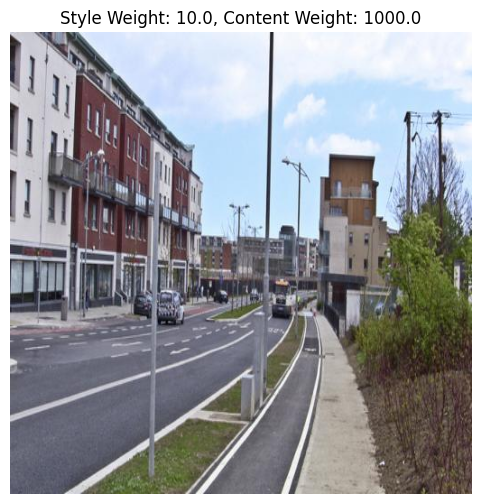

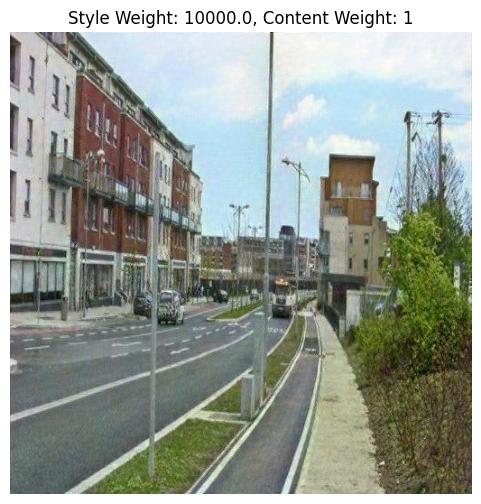

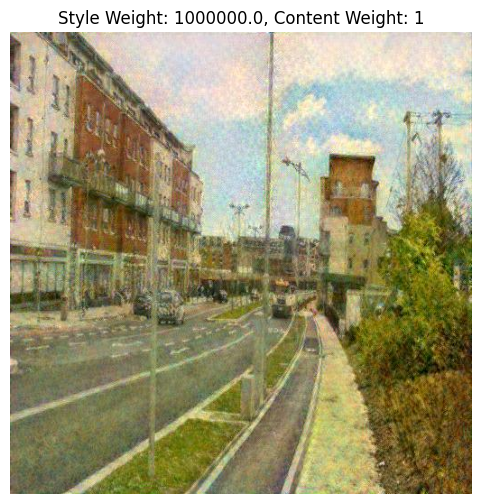

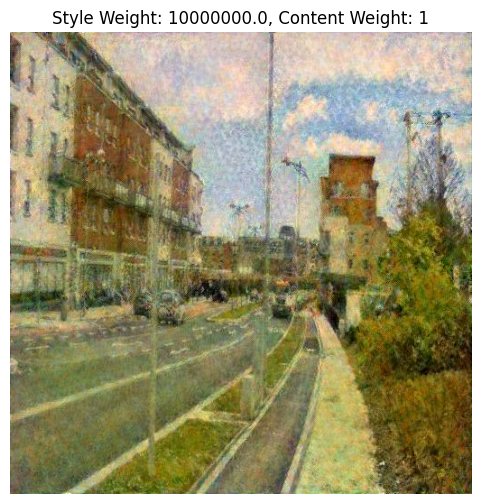

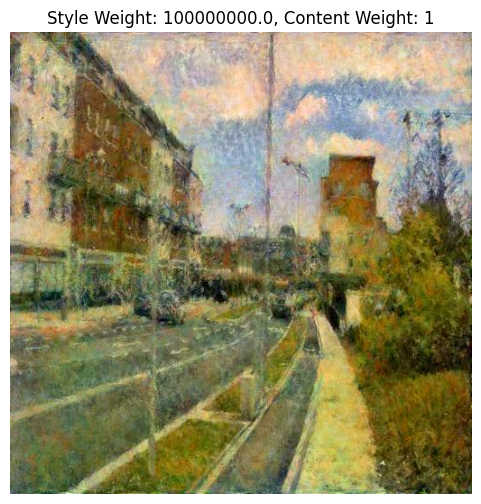

In [ ]:
image_dir = "./results/"
image_files = [
    'result_weight_1e+01.jpg',
    'result_weight_1e+04.jpg',
    'result_weight_1e+06.jpg',
    'result_weight_1e+07.jpg'
    'result_weight_1e+08.jpg'
]
style_weights = [1e1, 1e4, 1e6, 1e7, 1e8]
content_weights = [1e3, 1, 1, 1, 1]


# Function to display images with style weight and content weight labels
def display_images_with_labels():
    for idx, image_file in enumerate(image_files):
        # Build the full file path
        image_path = os.path.join(image_dir, image_file)
        
        # Check if the image file exists
        if os.path.exists(image_path):
            # Open the image
            img = Image.open(image_path)
            
            # Get corresponding style and content weights
            style_weight = style_weights[idx]
            content_weight = content_weights[idx]
            
            # Create the label for style weight and content weight
            label = f"Style Weight: {style_weight}, Content Weight: {content_weight}"
            
            # Display the image with the label
            plt.figure(figsize=(6, 6))
            plt.imshow(img)
            plt.title(label)
            plt.axis('off')  # Hide the axis
            plt.show()
        else:
            print(f"Image {image_file} not found.")

# Run the function to display the images
display_images_with_labels()

### Using optimizer_type='adam'

In [9]:
test_style_weights(content_path, style_path,output_dir='resultsadam',style_weight =1e1,content_weight=1e3,optimizer_type='adam',steps=100)
test_style_weights(content_path, style_path,output_dir='resultsadam',style_weight =1e4,content_weight=1,optimizer_type='adam',steps=100)
test_style_weights(content_path, style_path,output_dir='resultsadam',style_weight =1e6,content_weight=1,optimizer_type='adam',steps=100)
test_style_weights(content_path, style_path,output_dir='resultsadam',style_weight =1e7,content_weight=1,optimizer_type='adam',steps=100)
test_style_weights(content_path, style_path,output_dir='resultsadam',style_weight =1e8,content_weight=1,optimizer_type='adam',steps=100)



Testing style weight: 10.0
Starting style transfer with adam optimizer...
Step 10/100, Loss: 53.4880
Step 20/100, Loss: 22.6046
Step 30/100, Loss: 11.7159
Step 40/100, Loss: 7.0077
Step 50/100, Loss: 4.7117
Step 60/100, Loss: 3.5484
Step 70/100, Loss: 2.8277
Step 80/100, Loss: 2.4276
Step 90/100, Loss: 2.2074
Step 100/100, Loss: 2.0132

Testing style weight: 10000.0
Starting style transfer with adam optimizer...
Step 10/100, Loss: 0.1532
Step 20/100, Loss: 0.1074
Step 30/100, Loss: 0.0890
Step 40/100, Loss: 0.0792
Step 50/100, Loss: 0.0735
Step 60/100, Loss: 0.0700
Step 70/100, Loss: 0.0678
Step 80/100, Loss: 0.0662
Step 90/100, Loss: 0.0650
Step 100/100, Loss: 0.0642

Testing style weight: 1000000.0
Starting style transfer with adam optimizer...
Step 10/100, Loss: 2.3495
Step 20/100, Loss: 1.8355
Step 30/100, Loss: 1.5816
Step 40/100, Loss: 1.4562
Step 50/100, Loss: 1.3848
Step 60/100, Loss: 1.3394
Step 70/100, Loss: 1.3081
Step 80/100, Loss: 1.2852
Step 90/100, Loss: 1.2676
Step 100

({100000000.0: [906.5975341796875,
   391.6130065917969,
   212.74053955078125,
   138.19345092773438,
   102.35455322265625,
   82.58727264404297,
   72.9223403930664,
   68.68559265136719,
   66.3272933959961,
   64.6124038696289,
   62.7160758972168,
   60.3817024230957,
   57.68195343017578,
   54.79133987426758,
   51.8199462890625,
   48.861976623535156,
   46.022098541259766,
   43.32329559326172,
   40.782745361328125,
   38.41730880737305,
   36.2327766418457,
   34.23070526123047,
   32.4105110168457,
   30.760799407958984,
   29.265514373779297,
   27.911922454833984,
   26.68319320678711,
   25.56594467163086,
   24.54762840270996,
   23.613510131835938,
   22.757625579833984,
   21.974285125732422,
   21.256839752197266,
   20.598419189453125,
   19.991357803344727,
   19.42934799194336,
   18.90859603881836,
   18.42550277709961,
   17.97666358947754,
   17.557750701904297,
   17.16597557067871,
   16.799758911132812,
   16.45590591430664,
   16.133102416992188,
   15.829

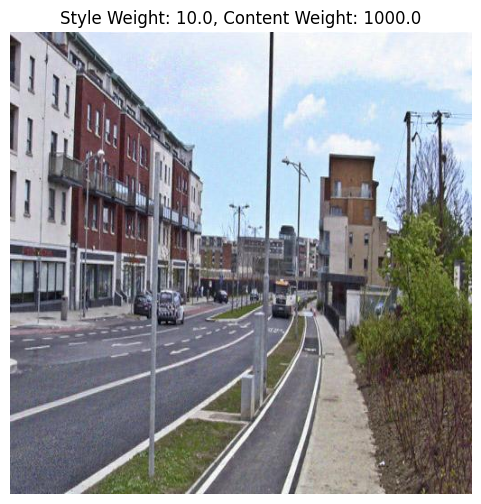

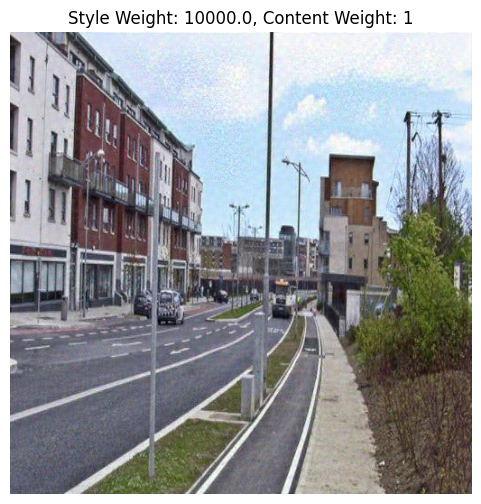

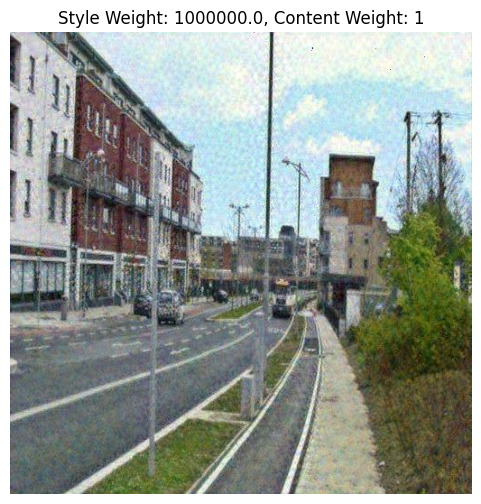

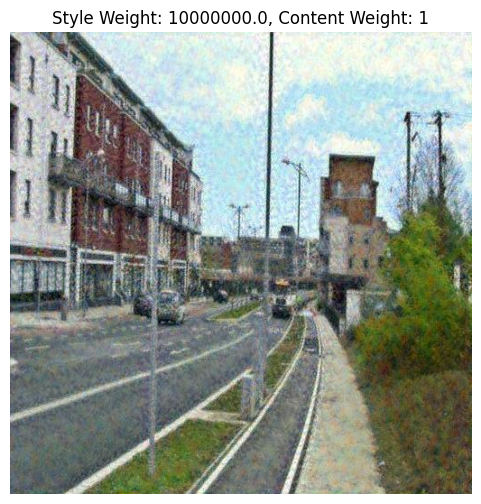

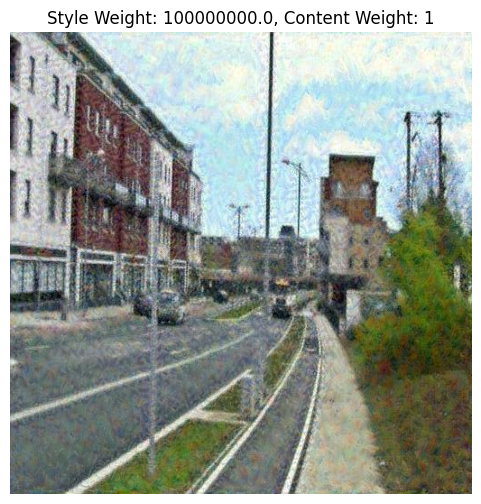

In [10]:
image_dir = "./resultsadam/"
image_files = [
    'result_weight_1e+01.jpg',
    'result_weight_1e+04.jpg',
    'result_weight_1e+06.jpg',
    'result_weight_1e+07.jpg',
    'result_weight_1e+08.jpg'
]
style_weights = [1e1, 1e4, 1e6, 1e7, 1e8]
content_weights = [1e3, 1, 1, 1, 1]


# Function to display images with style weight and content weight labels
def display_images_with_labels():
    for idx, image_file in enumerate(image_files):
        # Build the full file path
        image_path = os.path.join(image_dir, image_file)
        
        # Check if the image file exists
        if os.path.exists(image_path):
            # Open the image
            img = Image.open(image_path)
            
            # Get corresponding style and content weights
            style_weight = style_weights[idx]
            content_weight = content_weights[idx]
            
            # Create the label for style weight and content weight
            label = f"Style Weight: {style_weight}, Content Weight: {content_weight}"
            
            # Display the image with the label
            plt.figure(figsize=(6, 6))
            plt.imshow(img)
            plt.title(label)
            plt.axis('off')  # Hide the axis
            plt.show()
        else:
            print(f"Image {image_file} not found.")

# Run the function to display the images
display_images_with_labels()

###  Style Transfer Comparison: L-BFGS vs Adam Optimizer

### L-BFGS Results:
- **Slow convergence** but highly precise.
- Works best for **smaller style weights**, achieving low loss values (e.g., 0.0001).
- As **style weight increases**, L-BFGS shows slower loss reduction and might struggle with the balance between style and content.
- Ideal for **fine-grained style control** at the expense of longer optimization times.
- **Visually**, L-BFGS captures the style transfer more effectively, with finer details and a better blend of content and style.

### Adam Results:
- **Faster convergence** compared to L-BFGS but less precise.
- Effective for **smaller style weights**, where the loss quickly decreases (e.g., from 53.4 to 2.0).
- **Struggles with large style weights**, where the loss remains higher compared to L-BFGS.
- Suitable for **quicker results**, but may not capture as much style refinement when the style weight is too large.
 **Visually**, the style is not captured as well as with L-BFGS. The final output  appear less detailed, with fewer  features accurately transferred.


Testing LBFGS optimizer...


/home/pavan/miniconda3/envs/torchenv/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/pavan/miniconda3/envs/torchenv/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Starting style transfer with lbfgs optimizer...
Step 10/100, Loss: 1.1338
Step 20/100, Loss: 1.1104
Step 30/100, Loss: 1.1059
Step 40/100, Loss: 1.1036
Step 50/100, Loss: 1.1022
Step 60/100, Loss: 1.1014
Step 70/100, Loss: 1.1007
Step 80/100, Loss: 1.1002
Step 90/100, Loss: 1.0998
Step 100/100, Loss: 1.0994

Testing ADAM optimizer...


/home/pavan/miniconda3/envs/torchenv/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/pavan/miniconda3/envs/torchenv/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Starting style transfer with adam optimizer...
Step 10/100, Loss: 2.3493
Step 20/100, Loss: 1.8355
Step 30/100, Loss: 1.5816
Step 40/100, Loss: 1.4562
Step 50/100, Loss: 1.3846
Step 60/100, Loss: 1.3394
Step 70/100, Loss: 1.3083
Step 80/100, Loss: 1.2854
Step 90/100, Loss: 1.2678
Step 100/100, Loss: 1.2537


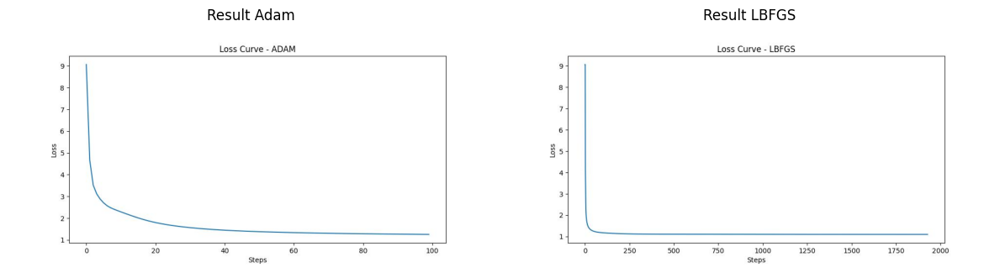

In [22]:
import matplotlib.image as mpimg

optimizer_results = compare_optimizers(content_path, style_path,num_steps=100)

def display_comparison_images(output_dir='results'):
    # Load the images
    img_adam = mpimg.imread(os.path.join(output_dir, 'loss_adam.jpg'))
    img_lbfgs = mpimg.imread(os.path.join(output_dir, 'loss_lbfgs.jpg'))
    
    # Create a figure to display the images side by side
    plt.figure(figsize=(12, 6))
    
    # Display the Adam image
    plt.subplot(1, 2, 1)
    plt.imshow(img_adam)
    plt.title('Result Adam')
    plt.axis('off')  # Hide axes
    
    # Display the LBFGS image
    plt.subplot(1, 2, 2)
    plt.imshow(img_lbfgs)
    plt.title('Result LBFGS')
    plt.axis('off')  # Hide axes
    
    # Show the plot
    plt.tight_layout()
    plt.show()

# Call this function after calling compare_optimizers
display_comparison_images()


Quality of Output and Domain Analysis:

1. Content Characteristics - Transfer Success:
- Strong geometric forms (keyboard, car surface, circular bowl)
- High-contrast elements (black cat against background, berry bowl on tablecloth)
- Clear subject-background separation (cat on car, berries on table)
- Distinct structural boundaries (cat silhouettes, table layout)

2. Content Characteristics - Transfer Challenges:
- Fine textures (cat fur details in both examples)
- Complex background elements (drawers, lamps in first example)
- Subtle lighting variations
- Mixed-texture scenes (picnic setup)

3. Style Transfer Works Well With:
- Consistent artistic styles (Monet-like patterns, abstract patterns)
- Unified color palettes (olive-green abstract, purple-blue landscape)
- Simple, repeating textures
- Atmospheric effects (impressionistic scenes)

4. Style Transfer Struggles With:
- Multiple competing textures
- Preserving intricate details
- Complex lighting conditions
- Dramatic style-content complexity mismatches

5. Key Observations from Examples:
- Color adaptation is more successful than texture preservation
- Geometric shapes maintain integrity better than organic forms
- Strong edges and contrasts survive style transfer well
- Background elements tend to blend more than foreground
- Local patterns transfer more effectively than global composition

6. Domain-Specific Effectiveness:
Works Best:
- Landscapes
- Still life scenes (picnic example)
- Architectural elements (keyboard to building transformation)
- High-contrast subjects (black cat example)

Less Effective:
- Detailed portraits
- Complex natural textures 
- Mixed lighting scenes     (e.x. last image of selfie)
- Fine detail-dependent images

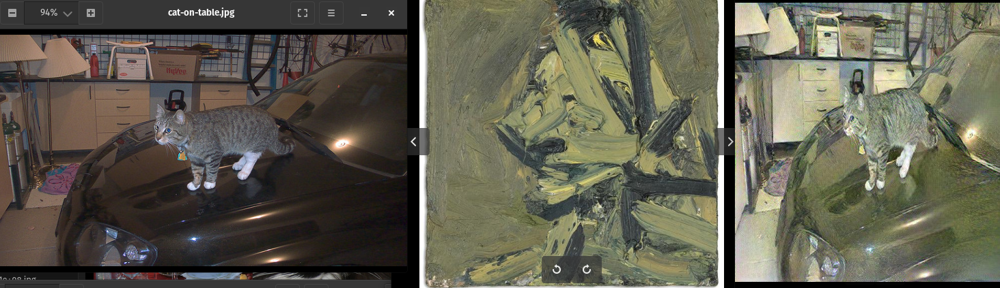

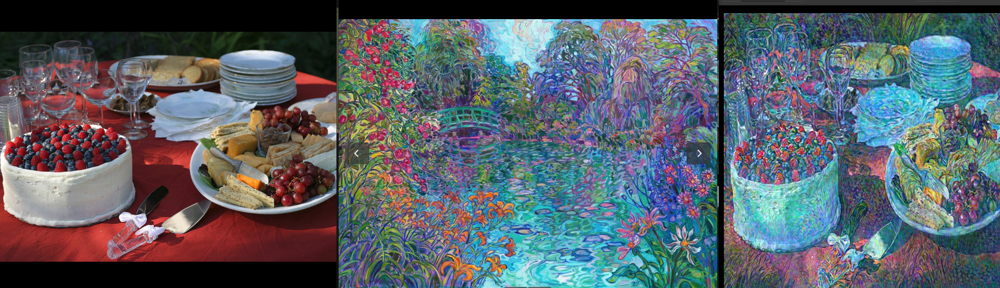

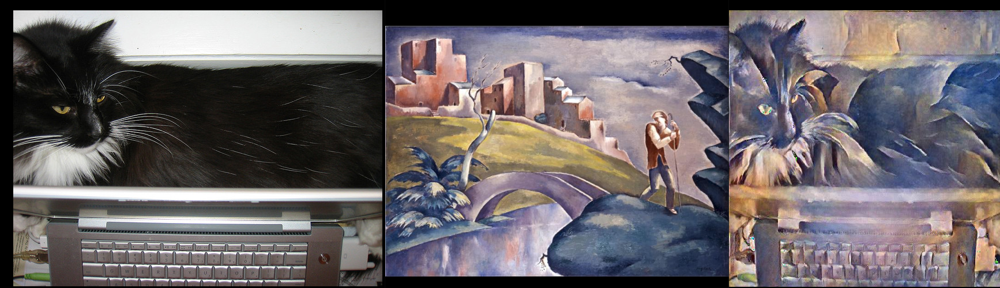
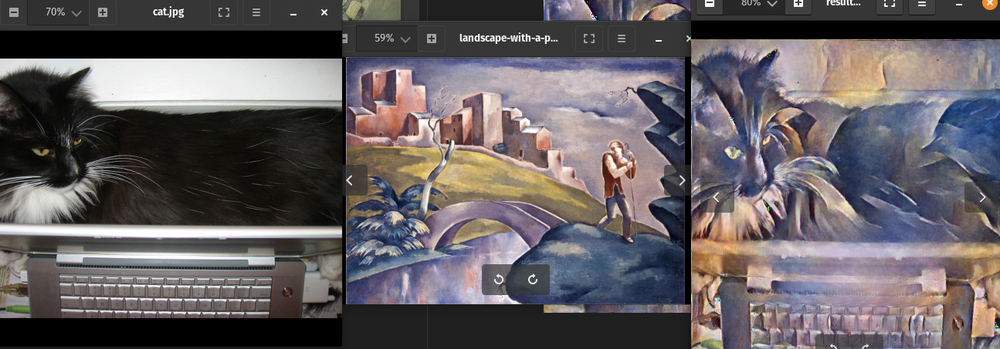

### Take a photograph of yourself, and transfer some style on it

In [41]:

content_path="./results/content.jpeg"
style_path="Dataset/Q3/styles/zebra.jpg"

a=test_style_weights(content_path, style_path,output_dir='results/selfie',style_weight =1e7,content_weight=1,steps=100)



Testing style weight: 10000000.0
Starting style transfer with lbfgs optimizer...
Step 10/100, Loss: 1.2453
Step 20/100, Loss: 1.1215
Step 30/100, Loss: 1.0838
Step 40/100, Loss: 1.0652
Step 50/100, Loss: 1.0607
Step 60/100, Loss: 1.0603
Step 70/100, Loss: 1.0624
Step 80/100, Loss: 1.0959
Step 90/100, Loss: 1.1948
Step 100/100, Loss: 1.0798


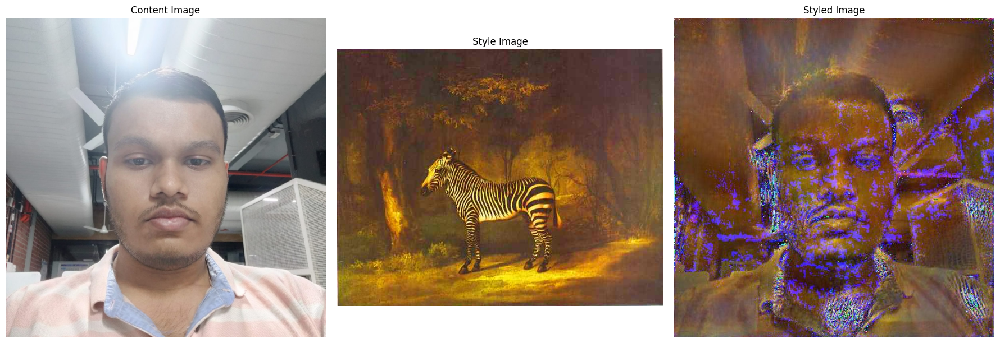

In [40]:

img_content = mpimg.imread(content_path)
img_style = mpimg.imread(style_path)

img_content_styled = mpimg.imread("./results/selfie/result_weight_1e+07.jpg")

# Create a figure to display the images side by side
plt.figure(figsize=(18, 6))

# Display the content image
plt.subplot(1, 3, 1)
plt.imshow(img_content)
plt.title('Content Image')
plt.axis('off')  # Hide axes

# Display the style image
plt.subplot(1, 3, 2)
plt.imshow(img_style)
plt.title('Style Image')
plt.axis('off')  # Hide axes

# Display the content-styled image
plt.subplot(1, 3, 3)
plt.imshow(img_content_styled)
plt.title('Styled Image')
plt.axis('off')  # Hide axes

# Show the plot
plt.tight_layout()
plt.show()